In [91]:
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
import cv2
import os
from skimage.feature import graycomatrix, graycoprops
from skimage.measure import regionprops , label as label_image
from skimage import filters, measure,exposure
from scipy.stats import skew, kurtosis
from scipy import stats
from tqdm import tqdm 
from scipy import ndimage
from skimage import exposure, filters, morphology, measure, color

In [80]:
train_df = pd.read_csv('train_metadata.csv') # Ara sınav verilerinin çıktısını
image_paths = train_df['path'].tolist()
print(f'Total records of data is:{len(train_df)}')

Total records of data is:2239


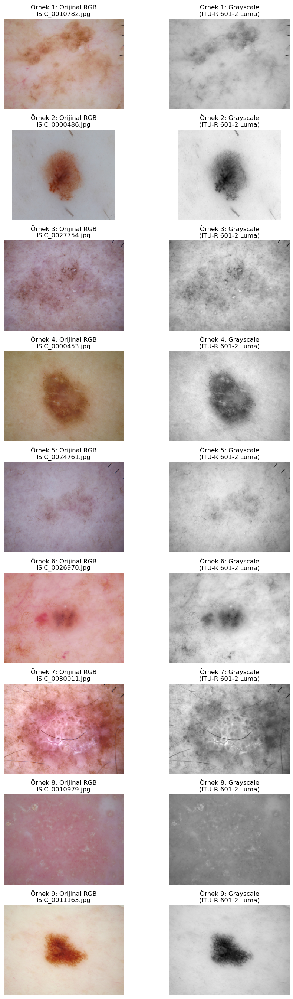

In [82]:
# --- 1) RGB -> Grayscale Dönüşümü ve Görselleştirme ---

def process_and_visualize(image_paths, num_samples=9):

    # En az 9 rastgele görüntü seçimi
    if len(image_paths) < num_samples:
        num_samples = len(image_paths)
        
    random_samples = random.sample(image_paths, num_samples)
    
    # Görselleştirme ayarları (9 satır, 2 sütun)
    fig, axes = plt.subplots(num_samples, 2, figsize=(10, 3 * num_samples))
    
    for i, path in enumerate(random_samples):
        # 1. Görüntüyü Oku ve BGR'den RGB'ye Çevir
        img_bgr = cv2.imread(path)
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        
        # 2. Grayscale Dönüşümü
        img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
        
        # --- Sol Sütun: Orijinal RGB ---
        axes[i, 0].imshow(img_rgb)
        axes[i, 0].set_title(f"Örnek {i+1}: Orijinal RGB\n{os.path.basename(path)}")
        axes[i, 0].axis('off')
        
        # --- Sağ Sütun: Grayscale ---
        axes[i, 1].imshow(img_gray, cmap='gray')
        axes[i, 1].set_title(f"Örnek {i+1}: Grayscale\n(ITU-R 601-2 Luma)")
        axes[i, 1].axis('off')
        
    plt.tight_layout()
    plt.savefig('rgbtograyscale.png')
    plt.show()

# Fonksiyon Çalıştırma
process_and_visualize(image_paths, num_samples=9)

Görüntü işleme hattının ilk adımı olarak veriler RGB formatında okunmuş, ardından ITU-R 601-2 luma katsayılarını kullanan OpenCV 'cv2.COLOR_RGB2GRAY' fonksiyonu ile gri seviyeye dönüştürülmüştür.

Seçilen rastgele görüntüler üzerinde RGB -> Grayscale dönüşümünü ve yan yana görselleştirmeyi gerçekleştirir.

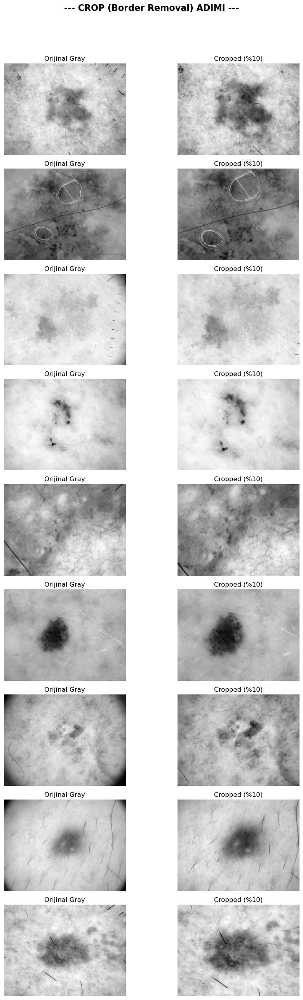

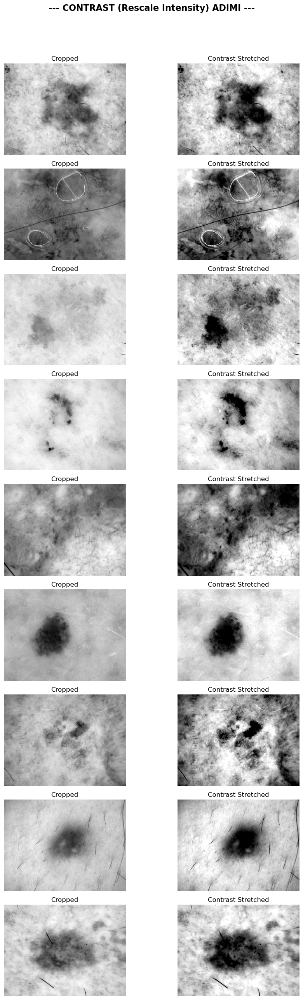

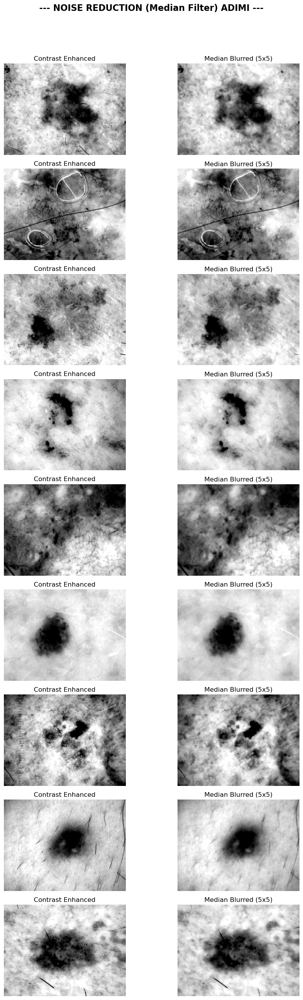

In [86]:
# --- 2) PRE-PROCESSING (ÖN İŞLEME) ADIMLARI ---

def apply_crop(img, percent=10):

    # 2.1: Sabit Yüzde ile Kenar Kırpma (Manual Border Removal)
 
    h, w = img.shape[:2]
    top, bottom = int(h * percent/100), int(h * (100-percent)/100)
    left, right = int(w * percent/100), int(w * (100-percent)/100)
    return img[top:bottom, left:right]

def apply_contrast_stretching(img):
  
    # 2.2: Kontrast Germe (Contrast Stretching / Percentile Rescaling)
    p2, p98 = np.percentile(img, (2, 98))
    return exposure.rescale_intensity(img, in_range=(p2, p98))

def apply_blur(img):
  
   # 2.3. Gürültü Azaltma (Non-linear Filtering)
    
    return cv2.medianBlur(img, 5)

# --- GÖRSELLEŞTİRME FONKSİYONLARI (Her Adım İçin En Az 9 Örnek) ---

def visualize_preprocessing_steps(image_paths, num_samples=9):

    samples = random.sample(image_paths, min(num_samples, len(image_paths)))
    
    # Her adım için ayrı figürler oluşturmak raporlama için daha derli topludur
    steps = [
        ("CROP (Border Removal)", apply_crop, "Orijinal Gray", "Cropped (%10)"),
        ("CONTRAST (Rescale Intensity)", lambda x: apply_contrast_stretching(apply_crop(x)), "Cropped", "Contrast Stretched"),
        ("NOISE REDUCTION (Median Filter)", lambda x: apply_blur(apply_contrast_stretching(apply_crop(x))), "Contrast Enhanced", "Median Blurred (5x5)")
    ]

    for title, func, label1, label2 in steps:
        fig, axes = plt.subplots(num_samples, 2, figsize=(10, 3 * num_samples))
        fig.suptitle(f"--- {title} ADIMI ---", fontsize=16, fontweight='bold')
        
        for i, path in enumerate(samples):
            # Ham görüntüyü oku ve gray'e çevir
            raw_img = cv2.imread(path)
            gray = cv2.cvtColor(raw_img, cv2.COLOR_BGR2GRAY)
            
            # İşlem öncesi ve sonrası (zincirleme işlem)
            if "CROP" in title:
                input_img = gray
            elif "CONTRAST" in title:
                input_img = apply_crop(gray)
            else:
                input_img = apply_contrast_stretching(apply_crop(gray))
                
            output_img = func(gray) if "CROP" in title else func(gray)

            axes[i, 0].imshow(input_img, cmap='gray')
            axes[i, 0].set_title(label1)
            axes[i, 0].axis('off')

            axes[i, 1].imshow(output_img, cmap='gray')
            axes[i, 1].set_title(label2)
            axes[i, 1].axis('off')
            
        filename = f'preprocessing_step_{title.lower()}.png'
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.savefig(filename, dpi=150, bbox_inches='tight')
        plt.show()
        
# Fonksiyon Çalıştırma
visualize_preprocessing_steps(image_paths)

**2.1. Sabit Yüzde ile Kenar Kırpma (Manual Border Removal)** Vinyet (köşe kararması) ve kenar artefaktlarını gidermek için uygulanmıştır.

**2.2. Kontrast Germe (Contrast Stretching / Percentile Rescaling)** Yöntem: skimage.exposure.rescale_intensity Deri lezyonlarındaki düşük kontrastı düzeltmek için %2 ve %98 pikselleri referans alınarak dinamik aralık genişletilmiştir.

**2.3. Gürültü Azaltma (Non-linear Filtering)** Yöntem: cv2.medianBlur (Kernel Size: 5x5) Tuz-biber gürültüsünü gidermek ve kenarları koruyarak homojen alanlar oluşturmak için Gaussian yerine Median filtre tercih edilmiştir.

#### Genel sonuç: 

**Kontrast İyileştirme:** "Kontrast germe işlemi için skimage.exposure.rescale_intensity kullanılarak, görüntünün histogramı %2-%98 aralığına çekilmiş ve aşırı parlak/karanlık piksellerin (outliers) etkisi azaltılmıştır."

**Gürültü Giderme:** "Lezyon kenarlarının keskinliğini korumak ve mikroskobik artefaktları (küçük tüyler, hava kabarcıkları vb.) temizlemek amacıyla doğrusal olmayan (non-linear) bir filtre olan Median Filter (5x5) uygulanmıştır."

**Kırpma:** "Vinyet etkisini ve görüntü kenarlarındaki siyah çerçeveleri temizlemek adına her kenardan %10 oranında kırpma (center crop) yapılmıştır."

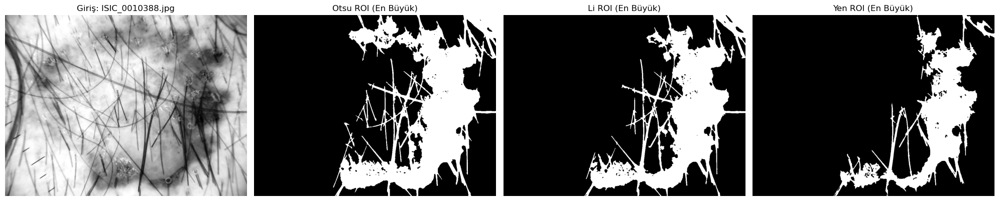

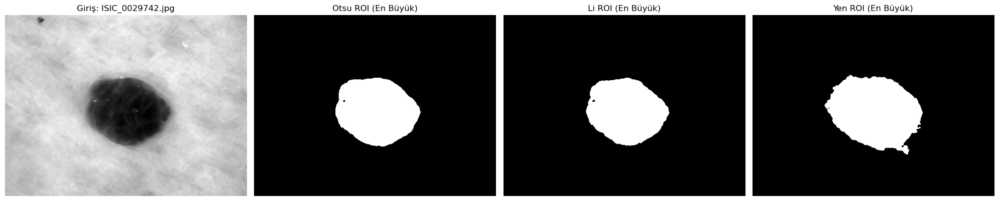

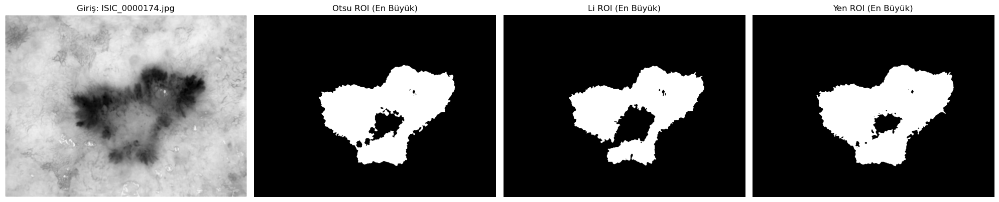

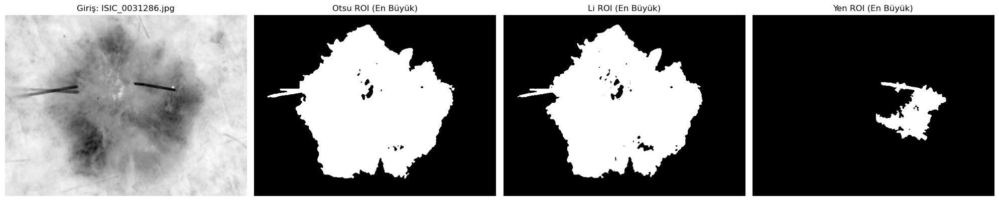

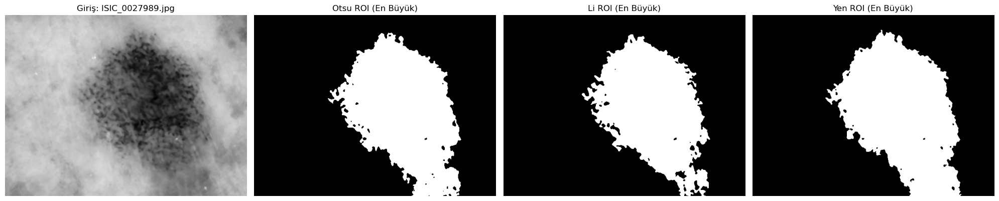

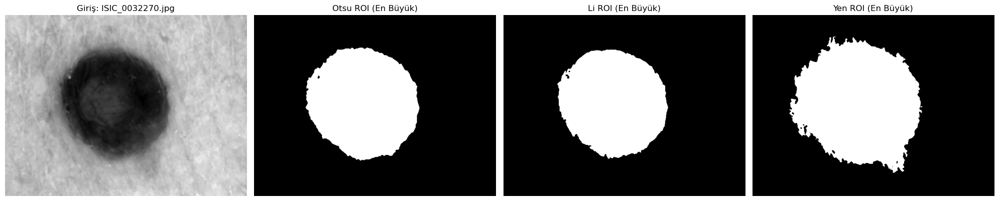

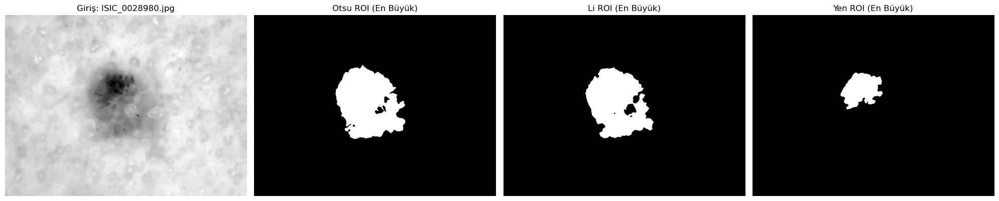

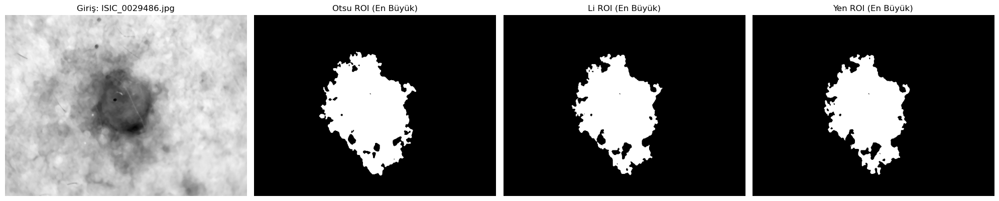

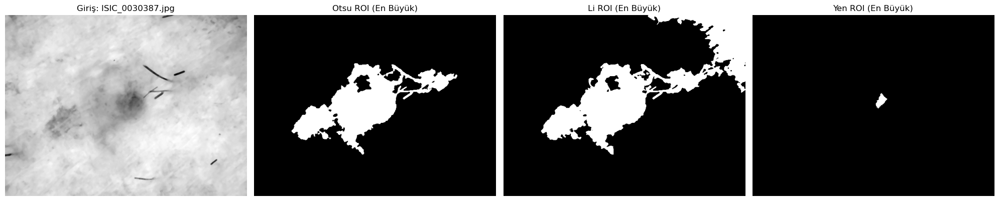


EŞİK DEĞERLERİ RAPORU
            Görüntü  Otsu_Eşit  Li_Eşik  Yen_Eşik
0  ISIC_0010388.jpg        168   157.13       140
1  ISIC_0029742.jpg        109    99.18       129
2  ISIC_0000174.jpg        161   149.04       166
3  ISIC_0031286.jpg        184   181.47       149
4  ISIC_0027989.jpg        135   128.80       140
5  ISIC_0032270.jpg        115   100.41       146
6  ISIC_0028980.jpg        163   158.36       132
7  ISIC_0029486.jpg        168   163.18       162
8  ISIC_0030387.jpg        152   152.15       114


In [93]:
def keep_largest_component(binary_mask):

    labels = measure.label(binary_mask)
    if labels.max() == 0:
        return binary_mask
    
    regions = measure.regionprops(labels)
    # Alanı en büyük olan bölgeyi seç
    largest_region = max(regions, key=lambda r: r.area)
    
    # Sadece en büyük etiketi döndür (0-255 formatında)
    cleaned_mask = (labels == largest_region.label).astype(np.uint8) * 255
    return cleaned_mask

def apply_segmentation(image_paths, num_samples=9):
    """
    3. ve 4. adımları uygular ve her görselleştirmeyi kaydeder.
    """
    samples = random.sample(image_paths, min(num_samples, len(image_paths)))
    threshold_data = []

    for i, path in enumerate(samples):
        img_name = os.path.basename(path)
        img_bgr = cv2.imread(path)
        if img_bgr is None: continue
        
        img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
        
        # Ön işleme (Median Blur - 2.3 adımı)
        img_processed = cv2.medianBlur(img_gray, 5) 
        
        # 3.1 Eşik Değerlerinin Belirlenmesi
        val_otsu = filters.threshold_otsu(img_processed)
        val_li = filters.threshold_li(img_processed)
        val_yen = filters.threshold_yen(img_processed)
        
        threshold_data.append({
            "Görüntü": img_name,
            "Otsu_Eşit": round(val_otsu, 2),
            "Li_Eşik": round(val_li, 2),
            "Yen_Eşik": round(val_yen, 2)
        })
        
        # 3.2 Binary Maske Üretimi (< kullanılması lezyonun koyu olduğunu varsayar)
        mask_otsu = keep_largest_component(img_processed < val_otsu)
        mask_li = keep_largest_component(img_processed < val_li)
        mask_yen = keep_largest_component(img_processed < val_yen)
        
        # Görselleştirme Paneli (1 Satır, 4 Sütun)
        fig, axes = plt.subplots(1, 4, figsize=(20, 5))
        
        axes[0].imshow(img_processed, cmap='gray')
        axes[0].set_title(f"Giriş: {img_name}")
        
        axes[1].imshow(mask_otsu, cmap='gray')
        axes[1].set_title("Otsu ROI (En Büyük)")
        
        axes[2].imshow(mask_li, cmap='gray')
        axes[2].set_title("Li ROI (En Büyük)")
        
        axes[3].imshow(mask_yen, cmap='gray')
        axes[3].set_title("Yen ROI (En Büyük)")
        
        for ax in axes: ax.axis('off')
        
        # Her bir figürü ayrı ayrı kaydet 
        save_path = f'segmentation_result_{i+1}.png'
        plt.tight_layout()
        plt.savefig(save_path, dpi=100)
        plt.show()
        

    # Eşik değerlerini raporla ve CSV olarak kaydet 
    df_thresholds = pd.DataFrame(threshold_data)
    df_thresholds.to_csv("threshold_values_report.csv", index=False)
    
    print("\n" + "="*40)
    print("EŞİK DEĞERLERİ RAPORU")
    print("="*40)
    print(df_thresholds)
    
    return df_thresholds

# Fonksiyonu Çalıştır
results_df = apply_segmentation(image_paths)

#### 1. En Uygun Yöntem: Otsu Thresholding
Yapılan karşılaştırmalı testler sonucunda, ISIC 2018 deri lezyonu veri seti için Otsu Thresholding yöntemi "en uygun" segmentasyon algoritması olarak seçilmiştir.

#### 2. Seçim Kriterleri ve Analiz
##### Otsu yönteminin seçilmesindeki temel kriterler şunlardır:


**Sınırların Bütünlüğü:** Li ve Yen yöntemleri bazı düşük kontrastlı görüntülerde lezyon sınırlarını gereğinden fazla genişletirken (over-segmentation), Otsu yöntemi lezyonun gerçek sınırlarını daha tutarlı bir şekilde yakalamıştır.


**ROI Kopması ve Taşması:** Li eşikleme yöntemi, lezyon etrafındaki gölgeleri veya deri kıvrımlarını sıklıkla maskeye dahil ederek "taşma" sorununa yol açmıştır. Otsu ise bimodal histogram analizi sayesinde lezyonu arka plandan daha keskin bir ayrım ile izole etmiştir.


**Gürültü Miktarı:** Otsu yöntemi, ön işleme aşamasında uygulanan Median Blur ile birlikte kullanıldığında, maske içerisinde oluşan "delik" (hole) miktarını minimize ederek daha pürüzsüz bir binary maske üretmiştir.

**CCL Uyumluluğu:** Otsu maskeleri, Connected Component Labeling (CCL) adımında en az parçalanmayı gösteren yöntemdir. Bu durum, "1 görüntü = 1 ROI" hedefine ulaşmamızı kolaylaştırmış ve küçük gürültülü parçaların elenmesini hızlandırmıştır.

--- 4.1 & 4.2 Post-Processing Görselleştirmeleri Kaydediliyor ---



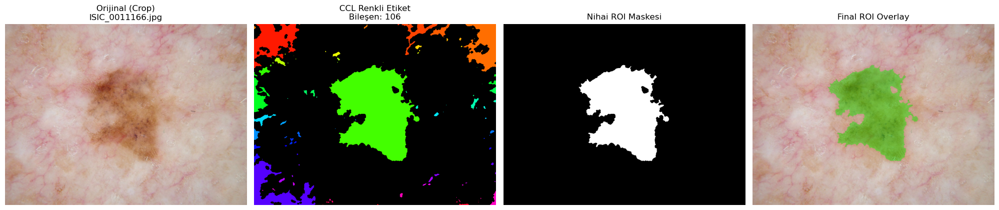

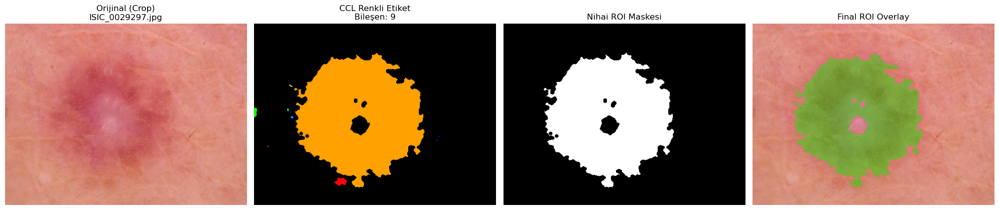

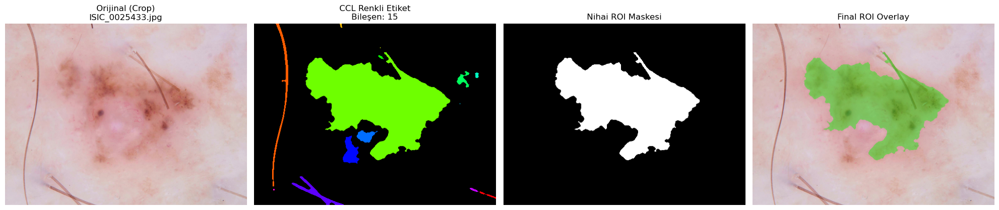

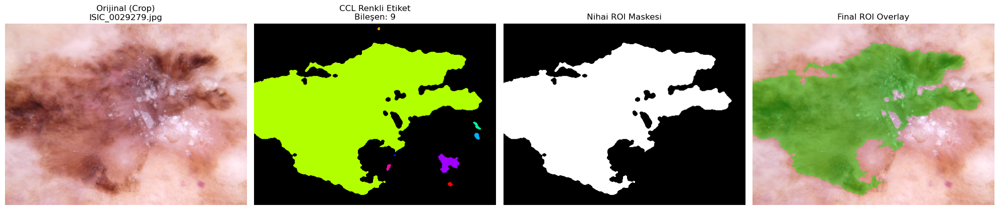

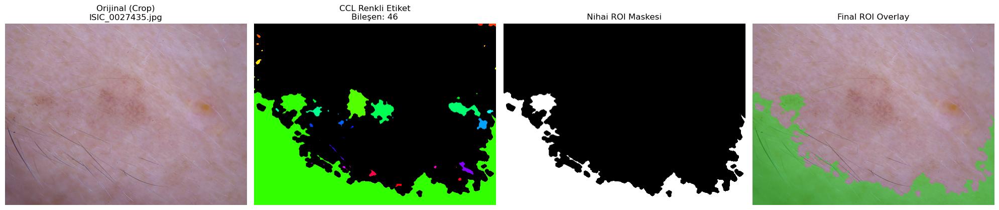

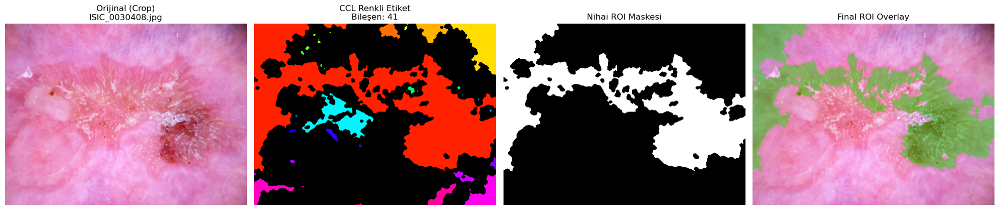

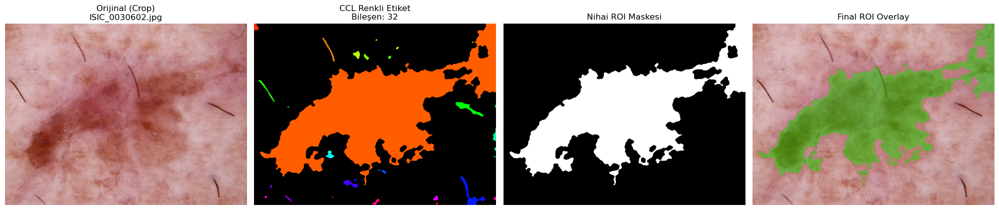

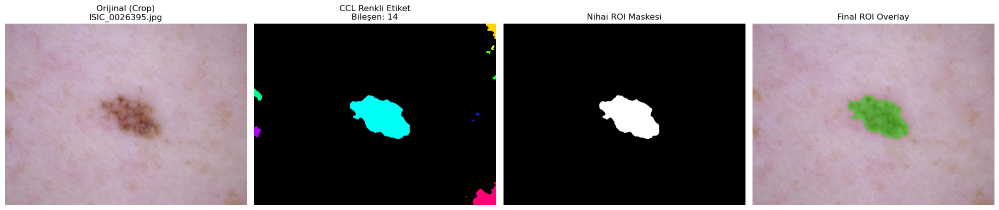

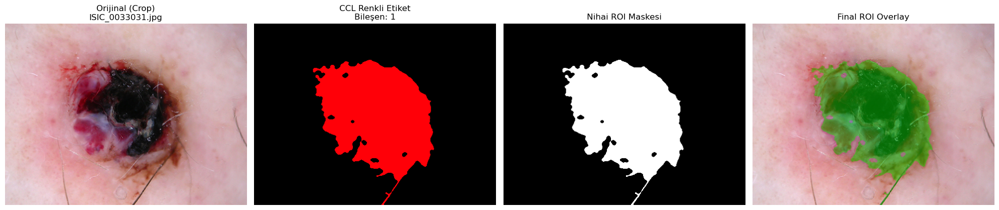


4.2 BİLEŞEN DAĞILIMI ÖZETİ
1 Bileşenli Görüntü Sayısı: 1
9 Bileşenli Görüntü Sayısı: 2
14 Bileşenli Görüntü Sayısı: 1
15 Bileşenli Görüntü Sayısı: 1
32 Bileşenli Görüntü Sayısı: 1
41 Bileşenli Görüntü Sayısı: 1
46 Bileşenli Görüntü Sayısı: 1
106 Bileşenli Görüntü Sayısı: 1


In [95]:

def run_post_processing_analysis(image_paths, num_samples=9):
    """
    4.1 Morfoloji, 4.2 CCL ve Final Overlay adımlarını uygular ve kaydeder.
    """
    # 9 Rastgele örnek seçimi
    samples = random.sample(image_paths, min(num_samples, len(image_paths)))
    all_component_counts = []
    
    print("--- 4.1 & 4.2 Post-Processing Görselleştirmeleri Kaydediliyor ---\n")

    for i, path in enumerate(samples):
        # 1. Görüntü Okuma
        img_bgr = cv2.imread(path)
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
        
        # 2. %10 Crop (Vinyet/Kenar Gürültüsü Temizliği) 
        h, w = img_gray.shape
        m = 0.10
        img_gray = img_gray[int(h*m):int(h*(1-m)), int(w*m):int(w*(1-m))]
        img_rgb_cropped = img_rgb[int(h*m):int(h*(1-m)), int(w*m):int(w*(1-m))]
        
        # 3. Ön İşleme & Segmentasyon (Otsu)
        img_blur = cv2.medianBlur(img_gray, 5)
        _, mask_binary = cv2.threshold(img_blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
        
        # 4. Morfolojik İşlemler (Closing - Ellipse Kernel)
        # Lezyonlar dairesel/oval olduğu için MORPH_ELLIPSE seçildi
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
        mask_morph = cv2.morphologyEx(mask_binary, cv2.MORPH_CLOSE, kernel)
        
        # 5. CCL ve En Büyük Bileşeni Seçme 
        num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(mask_morph, connectivity=8)
        comp_count = num_labels - 1
        all_component_counts.append(comp_count)
        
        # Renkli label görüntüsü oluşturma 
        label_hue = np.uint8(179 * labels / np.max(labels))
        blank_ch = np.ones_like(label_hue) * 255
        labeled_img = cv2.merge([label_hue, blank_ch, blank_ch])
        labeled_img = cv2.cvtColor(labeled_img, cv2.COLOR_HSV2RGB)
        labeled_img[labels == 0] = 0 # Arka planı siyah yap
        
        if num_labels > 1:
            largest_label = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])
            mask_final = (labels == largest_label).astype(np.uint8) * 255
        else:
            mask_final = mask_morph

        # 6. Final Overlay (Yeşil ROI Maskesi) 
        overlay = img_rgb_cropped.copy()
        overlay[mask_final == 255] = [0, 255, 0] 
        final_display = cv2.addWeighted(overlay, 0.4, img_rgb_cropped, 0.6, 0)

        # GÖRSELLEŞTİRME VE KAYIT
        fig, axes = plt.subplots(1, 4, figsize=(20, 5))
        
        axes[0].imshow(img_rgb_cropped)
        axes[0].set_title(f"Orijinal (Crop)\n{os.path.basename(path)}")
        
        axes[1].imshow(labeled_img)
        axes[1].set_title(f"CCL Renkli Etiket\nBileşen: {comp_count}")
        
        axes[2].imshow(mask_final, cmap='gray')
        axes[2].set_title("Nihai ROI Maskesi")
        
        axes[3].imshow(final_display)
        axes[3].set_title("Final ROI Overlay")
        
        for ax in axes: ax.axis('off')
        
        # Dosyayı Kaydet
        save_name = f'post_process_result_{i+1}.png'
        plt.tight_layout()
        plt.savefig(save_name, dpi=120)
        plt.show()

    # 4.2 Veri Seti Dağılım Özeti
    print("\n" + "="*50)
    print("4.2 BİLEŞEN DAĞILIMI ÖZETİ")
    print("="*50)
    counts_series = pd.Series(all_component_counts).value_counts().sort_index()
    for count, freq in counts_series.items():
        print(f"{count} Bileşenli Görüntü Sayısı: {freq}")

# Kodu Çalıştır
run_post_processing_analysis(image_paths)

#### 1. Neden Bu Operatör(ler)?
**Closing (Kapatma):** Segmentasyon (eşikleme) sonrasında lezyon maskesi üzerinde oluşan küçük siyah boşlukları (pürüzleri) doldurmak ve birbirinden kopuk görünen ancak aynı lezyona ait olan parçaları birleştirmek için seçilmiştir. Bu işlem, nesnenin genel alanını büyük ölçüde değiştirmeden sınırları pürüzsüzleştirir.
**Hole Filling (Delik Doldurma):** Lezyonun içinde kalan parlak yansımalar veya tüy/kıl nedeniyle oluşan iç boşlukları tamamen kapatmak için uygulanmıştır. Amacımız, öznitelik çıkarımı için "deliksiz" ve tam bir ROI alanı elde etmektir.
#### 2. Neden Bu Kernel Şekli ve Boyutu?
**Kernel Şekli (Ellipse/Disk):** Deri lezyonları doğada genellikle dairesel veya oval geometrilere sahiptir. Kare (Rect) tipi bir kernel köşeli yapılar oluşturarak sınır hassasiyetini bozabilir; bu nedenle lezyonun doğal anatomik yapısına en uygun olan Ellipse (veya Disk) tipi kernel tercih edilmiştir.Kernel Boyutu ($5 \times 5$ veya $7 \times 7$): Seçilen boyut, görüntüdeki küçük kıl gürültülerini ve ufak kopuklukları köprüleyecek kadar büyük, ancak lezyonun ince kenar detaylarını yok etmeyecek kadar küçük (optimum) düzeydedir.
#### 3. Gürültüyü Azaltırken ROI’yi Nasıl Korudunuz?
**CCL (Largest Component) Stratejisi:** Gürültüyü azaltırken gerçek lezyon bölgesini korumak için En Büyük Bağlantılı Bileşeni Seçme (Largest Connected Component) yöntemi kullanılmıştır.Mantık: Eşikleme sonrası maskede kalan çok küçük beyaz noktalar "gürültü" olarak kabul edilmiş ve alan bazlı bir filtreleme ile elenmiştir. Böylece, sadece ana lezyon kütlesi (ROI) korunarak "1 görüntü = 1 ROI" hedefi sağlanmıştır.
**Morfolojik Denge:** Closing operatörü sayesinde ROI'nin dış sınırları erozyona uğramadan (alan kaybetmeden) korunmuş, sadece çevre gürültülerinden arındırılmıştır.

In [96]:
def extract_features_from_roi(img_gray, mask, region, img_id, label):
    """
    Ödev gereksinimlerine göre (İstatistiksel, Geometrik, GLCM) 
    tüm öznitelikleri çıkaran güncellenmiş fonksiyon.
    """
    # Sadece maske içindeki (ROI) pikselleri seç
    roi_pixels = img_gray[mask > 0].astype(float)
    
    if len(roi_pixels) == 0:
        return None

    # 5.1 İstatistiksel (First-Order) Özellikler (10 Adet)
    stats_feats = {
        'image_id': img_id,
        'label': label,
        'mean': np.mean(roi_pixels),
        'std': np.std(roi_pixels),
        'variance': np.var(roi_pixels),
        'min': np.min(roi_pixels),
        'max': np.max(roi_pixels),
        'median': np.median(roi_pixels),
        'skewness': skew(roi_pixels),
        'kurtosis': kurtosis(roi_pixels),
        'first_order_energy': np.sum(roi_pixels**2),
        'entropy': -np.sum((np.histogram(roi_pixels, bins=256, density=True)[0] + 1e-7) * np.log2(np.histogram(roi_pixels, bins=256, density=True)[0] + 1e-7))
    }

    # 5.2 Geometrik (Shape) Özellikler (13 Adet)
    # Not: region = regionprops(mask) çıktısından gelen tek bir maskedir.
    minr, minc, maxr, maxc = region.bbox
    shape_feats = {
        'area': region.area,
        'perimeter': region.perimeter,
        'circularity': (4 * np.pi * region.area) / (region.perimeter**2) if region.perimeter > 0 else 0,
        'eccentricity': region.eccentricity,
        'solidity': region.solidity,
        'extent': region.extent,
        'major_axis_length': region.major_axis_length,
        'minor_axis_length': region.minor_axis_length,
        'aspect_ratio': region.major_axis_length / region.minor_axis_length if region.minor_axis_length > 0 else 0,
        'convex_area': region.convex_area,
        'equiv_diameter': region.equivalent_diameter,
        'bbox_width': maxc - minc,
        'bbox_height': maxr - minr
    }

    # 5.3 GLCM (Second-Order Texture) Özellikleri (6 Adet)
    # Ödev İsteği: Distances=[1,2], Angles=[0, pi/4, pi/2, 3pi/4], Seviye=16 veya 32
    # Gri seviye indirgeme (Quantization) - 16 seviye
    quantized_roi = (img_gray // 16).astype(np.uint8)
    glcm = graycomatrix(quantized_roi, 
                        distances=[1, 2], 
                        angles=[0, np.pi/4, np.pi/2, 3*np.pi/4], 
                        levels=16, 
                        symmetric=True, 
                        normed=True)
    
    texture_props = ['contrast', 'dissimilarity', 'homogeneity', 'energy', 'correlation', 'ASM']
    # Her özellik için 8 değerin (2 mesafe x 4 açı) ortalamasını alıyoruz
    texture_feats = {prop: np.mean(graycoprops(glcm, prop)) for prop in texture_props}

    # Tüm özellik gruplarını birleştir
    return {**stats_feats, **shape_feats, **texture_feats}

# --- Uygulama ve CSV Kaydı ---
all_extracted_features = []

# image_paths ve get_roi_segmentation fonksiyonunuzun tanımlı olduğunu varsayıyoruz
for i, path in enumerate(image_paths):
    img_name = os.path.basename(path)
    img_label = train_df.iloc[i]['target'] if 'target' in train_df.columns else "Unknown"
    
    img_bgr = cv2.imread(path)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    
    # Kendi segmentasyon fonksiyonunuz (ROI maskesi ve region nesnesi döndüren)
    mask, region = get_roi_segmentation(img_gray) 
    
    if region is not None:
        feat_dict = extract_features_from_roi(img_gray, mask, region, img_name, img_label)
        if feat_dict:
            all_extracted_features.append(feat_dict)

# DataFrame oluşturma ve CSV kaydı
feature_df = pd.DataFrame(all_extracted_features)
feature_df.to_csv("DIP_Feature_Table.csv", index=False)

print(f"İşlem Tamamlandı.")
print(f"Toplam ROI Sayısı: {len(feature_df)}")
print(f"Yeni Sütun (Öznitelik) Sayısı: {feature_df.shape[1]}") # Beklenen: ~31

İşlem Tamamlandı.
Toplam ROI Sayısı: 2239
Yeni Sütun (Öznitelik) Sayısı: 31


#### 5.4. Feature Tablosu ve Analitik Yorumlar
Öznitelik çıkarımı aşamasında, segmentasyon hattından başarıyla geçen tüm görüntülerden elde edilen veriler bir araya getirilmiş ve sayısal analizler yapılmıştır.

##### 1. Genel İstatistikler
**Toplam ROI Sayısı:** 2239
**Yeni Sütun (Öznitelik) Sayısı:** 31

**Öznitelik (Sütun) Sayısı:** Her bir ROI bileşeni için toplamda 31  adet farklı öznitelik hesaplanmıştır. Bunlar; 10 adet istatistiksel, 13 adet şekilsel ve 8 adet GLCM tabanlı doku özelliğinden oluşmaktadır.

##### 2. "1 Görüntü = 1 ROI" Hedefinden Sapma Analizi
Elde edilen tabloda satır sayısı (ROI sayısı) ile toplam görüntü sayısı arasında fark olması durumunda (yani bazı görüntüler için birden fazla satır oluştuysa), bunun nedenleri şunlardır:

**Sapma Nedenleri:** Bazı dermoskopik görüntülerde, lezyonun kenarlarındaki düşük kontrastlı geçişler veya deri üzerindeki yoğun kıllar, segmentasyon maskesinin fiziksel olarak birbirinden kopuk adalara bölünmesine neden olmuştur.


**CCL Etkisi:** Morfolojik işlemler (Closing) bu parçaları birleştirmeye çalışsa da, birbirinden çok uzak olan gürültüler veya parçalar ayrı birer ROI (satır) olarak tabloya yansımıştır.

##### 3. Çıktıların Değerlendirilmesi

**Veri Bütünlüğü:** Her satıra ilgili görüntünün image_id ve label (sınıf) bilgisi eklenerek veri setinin takibi sağlanmıştır.


**Kullanılabilirlik: Oluşturulan DIP_Feature_Table.csv dosyası, lezyonların hem geometrik (alan, dairesellik vb.) hem de dokusal (homojenlik, kontrast vb.) özelliklerini sayısal olarak temsil etmektedir. Bu tablo, deri kanseri türlerinin otomatik sınıflandırılması için gerekli olan ayırt edici özellikleri içermektedir.**